In [1]:
import pandas as pd
from pandas.plotting import scatter_matrix
import numpy as np
import plotly.express as px
px.defaults.width = 600
import plotly.graph_objs as go

from sklearn.datasets import fetch_openml
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import cross_val_score, cross_val_predict, GridSearchCV
from sklearn.experimental import enable_halving_search_cv  
from sklearn.model_selection import HalvingGridSearchCV
from sklearn.base import BaseEstimator
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, precision_score, recall_score, f1_score, precision_recall_curve, roc_curve, roc_auc_score, accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier

from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder, StandardScaler, MinMaxScaler
from sklearn.compose import ColumnTransformer

In [4]:
mnist = fetch_openml('mnist_784', version=1, as_frame=False)
mnist.keys()

dict_keys(['data', 'target', 'frame', 'categories', 'feature_names', 'target_names', 'DESCR', 'details', 'url'])

In [6]:
X, y = mnist['data'], mnist['target']
print(X.shape, y.shape)

(70000, 784) (70000,)


In [4]:
some_digit = X[0]
some_digit_image = some_digit.reshape(28, 28)

px.imshow(some_digit_image, color_continuous_scale='gray_r')

In [5]:
y[0]

'5'

In [4]:
y = y.astype(np.uint8)

In [7]:
X_train, X_test, y_train, y_test = X[:60000], X[60000:], y[:60000], y[60000:]

Binary Classifier

In [8]:
y_train_5 = (y_train == 5)
y_test_5 = (y_test == 5)


In [9]:
sgd = SGDClassifier(random_state=69)
sgd.fit(X_train, y_train_5)
sgd.predict([some_digit])


array([ True])

Performance Measures

In [10]:
cross_val_score(sgd, X_train, y_train_5, cv=3, scoring='accuracy')

array([0.96825, 0.96335, 0.9435 ])

In [11]:
class Never5Classifier(BaseEstimator):
    def fit(self, X, y=None):
        pass
    def predict(self, X):
        return np.zeros((len(X), 1), dtype=bool)



In [12]:
never_5_clf = Never5Classifier()
cross_val_score(never_5_clf, X_train, y_train_5, cv=3, scoring='accuracy' )

array([0.91125, 0.90855, 0.90915])

Confusion Matrix

In [13]:
y_train_pred = cross_val_predict(sgd, X_train, y_train_5, cv=3)

In [14]:
confusion_matrix(y_train_5, y_train_pred)

array([[53054,  1525],
       [  973,  4448]], dtype=int64)

The first row of this matrix considers non-5 images (the nega‐
tive class): 53,057 of them were correctly classified as non-5s (they are called true
negatives), while the remaining 1,522 were wrongly classified as 5s (false positives).
The second row considers the images of 5s (the positive class): 1,325 were wrongly
classified as non-5s (false negatives), while the remaining 4,096 were correctly classi‐
fied as 5s (true positives).

In [15]:
confusion_matrix(y_train_5, y_train_5)

array([[54579,     0],
       [    0,  5421]], dtype=int64)

In [16]:
precision_score(y_train_5, y_train_pred)

0.7446844131927005

It's only correct 74% in predcting a 5

In [17]:
recall_score(y_train_5, y_train_pred)

0.8205128205128205

It only detects 82% of tha 5's

In [18]:
f1_score(y_train_5, y_train_pred)

0.7807618044584869

Precision/Recall Tradeoff

In [19]:
y_scores = sgd.decision_function([some_digit])
y_scores

array([283.90369052])

In [20]:
treshold = 0
y_some_digit_pred = (y_scores > treshold)
y_some_digit_pred

array([ True])

In [21]:
treshold = 6969
y_some_digit_pred = (y_scores > treshold)
y_some_digit_pred

array([False])

Increasing the decision function's treshold decreases recall

In [22]:
y_scores = cross_val_predict(sgd, X_train, y_train_5, cv=3, method='decision_function')


In [23]:
precisions, recalls, thresholds = precision_recall_curve(y_train_5, y_scores)

In [24]:
px.line(y=[precisions[:-1], recalls[:-1]], x=thresholds, labels={'precisions':'precisions', 'recalls': 'recalls'})

In [25]:
px.line(x=recalls, y=precisions )

In [26]:
threshold_90_precision = thresholds[np.argmax(precisions >= 0.9)]
threshold_90_precision

4395.66607432071

In [27]:
y_train_pred_90 = (y_scores >= threshold_90_precision)
precision_score(y_train_5, y_train_pred_90)

0.9000524658971668

In [28]:
recall_score(y_train_5, y_train_pred_90)

0.632909057369489

In [29]:
fpr, tpr, thresholds = roc_curve(y_train_5, y_scores)

In [30]:
fig = px.line(x=fpr, y=tpr)
fig.show()

In [31]:
roc_auc_score(y_train_5, y_scores)

0.962639382424524

In [32]:
forest_clf = RandomForestClassifier(random_state=69)
y_probas_forest = cross_val_predict(forest_clf, X_train, y_train_5, cv=3, method='predict_proba')
y_scores_forest = y_probas_forest[:, 1] #probability of positive class


In [33]:
fpr_forest, tpr_forest, thresholds_forest = roc_curve(y_train_5, y_scores_forest)

In [34]:
fig.add_scatter(x=fpr_forest, y=tpr_forest, mode='lines')
fig.add_shape(type='line', x0=0, y0=0, x1=1, y1=1)
fig.show()

In [35]:
roc_auc_score(y_train_5, y_scores_forest)

0.9983154768905237

Multiclass Classification

In [36]:
sgd = SGDClassifier(loss='modified_huber')
sgd.fit(X_train, y_train)


SGDClassifier(loss='modified_huber')

In [37]:
sgd.predict([some_digit])

array([3], dtype=uint8)

In [38]:
sgd.get_params()

{'alpha': 0.0001,
 'average': False,
 'class_weight': None,
 'early_stopping': False,
 'epsilon': 0.1,
 'eta0': 0.0,
 'fit_intercept': True,
 'l1_ratio': 0.15,
 'learning_rate': 'optimal',
 'loss': 'modified_huber',
 'max_iter': 1000,
 'n_iter_no_change': 5,
 'n_jobs': None,
 'penalty': 'l2',
 'power_t': 0.5,
 'random_state': None,
 'shuffle': True,
 'tol': 0.001,
 'validation_fraction': 0.1,
 'verbose': 0,
 'warm_start': False}

In [39]:
sgd.predict_proba([some_digit])

array([[0. , 0. , 0. , 0.5, 0. , 0.5, 0. , 0. , 0. , 0. ]])

In [40]:
some_digit_scores = sgd.decision_function([some_digit])
some_digit_scores

array([[-3.50415694e+04, -6.01142234e+04, -3.36300399e+04,
         2.24580714e+03, -7.91937621e+04,  4.95887180e+01,
        -1.56644532e+05, -3.79900213e+04, -2.68946974e+04,
        -8.54626666e+04]])

In [41]:
np.argmax(some_digit_scores)

3

In [42]:
sgd.classes_

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], dtype=uint8)

In [43]:
forest_clf.fit(X_train, y_train)

RandomForestClassifier(random_state=69)

In [44]:
forest_clf.predict([some_digit])

array([5], dtype=uint8)

In [45]:
forest_clf.predict_proba([some_digit])

array([[0.01, 0.  , 0.01, 0.11, 0.  , 0.82, 0.02, 0.03, 0.  , 0.  ]])

In [46]:
cross_val_score(sgd, X_train, y_train, cv=3, scoring='accuracy')

array([0.8661, 0.878 , 0.879 ])

In [6]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train.astype(np.float64))


In [48]:
cross_val_score(sgd, X_train_scaled, y_train, cv=3, scoring="accuracy")

c:\Users\zsena\anaconda3\envs\homl2\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:696: ConvergenceWarning:

Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.

c:\Users\zsena\anaconda3\envs\homl2\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:696: ConvergenceWarning:

Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.



Error Analysis

In [ ]:
y_train_pred = cross_val_predict(sgd, X_train_scaled, y_train, cv=3 )
conf_mx = confusion_matrix(y_train, y_train_pred)
conf_mx

array([[5597,    0,   21,    7,    9,   42,   33,    7,  206,    1],
       [   1, 6404,   39,   24,    4,   43,    4,    8,  203,   12],
       [  28,   27, 5257,   96,   73,   24,   66,   38,  338,   11],
       [  26,   18,  118, 5251,    2,  208,   27,   41,  367,   73],
       [  12,   14,   47,   10, 5220,   11,   37,   28,  290,  173],
       [  30,   16,   30,  172,   53, 4468,   80,   16,  489,   67],
       [  28,   15,   41,    3,   41,   96, 5571,    5,  117,    1],
       [  20,    8,   52,   28,   52,   12,    3, 5721,  159,  210],
       [  19,   64,   47,   89,    3,  121,   28,   11, 5421,   48],
       [  23,   19,   29,   66,  127,   34,    1,  182,  325, 5143]],
      dtype=int64)

In [ ]:
sgd.classes_

array(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9'], dtype='<U1')

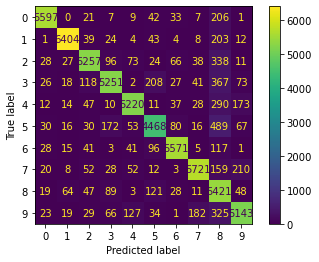

In [ ]:
conf_mx_disp = ConfusionMatrixDisplay(conf_mx, display_labels=sgd.classes_)
conf_mx_disp.plot()


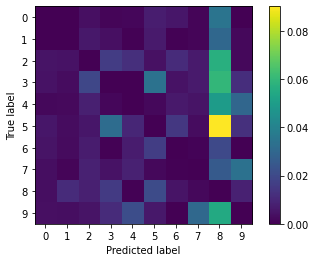

In [ ]:
row_sums = conf_mx.sum(axis=1, keepdims=True)
norm_conf_mx = conf_mx / row_sums
np.fill_diagonal(norm_conf_mx, 0)
ConfusionMatrixDisplay(norm_conf_mx, display_labels=sgd.classes_).plot(include_values=False)

EXERCISE 1

rows
represent actual classes, while columns represent predicted classes.

In [7]:
knn_clf = KNeighborsClassifier()
knn_clf.fit(X_train_scaled, y_train)


KNeighborsClassifier()

In [ ]:
parameters = [{'p':[1, 2], 'n_neighbors':[ 5, 7, 9], 'algorithm':['ball_tree', 'kd_tree']}]

In [ ]:
knn_search = HalvingGridSearchCV(knn_clf, parameters, scoring='accuracy', cv=3, verbose=2, resource='n_samples', min_resources='exhaust')
knn_search.fit(X_train_scaled, y_train)

n_iterations: 3
n_required_iterations: 3
n_possible_iterations: 3
min_resources_: 6666
max_resources_: 60000
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 12
n_resources: 6666
Fitting 3 folds for each of 12 candidates, totalling 36 fits
[CV] END ............algorithm=ball_tree, n_neighbors=5, p=1; total time=  13.0s
[CV] END ............algorithm=ball_tree, n_neighbors=5, p=1; total time=  13.3s
[CV] END ............algorithm=ball_tree, n_neighbors=5, p=1; total time=  13.4s
[CV] END ............algorithm=ball_tree, n_neighbors=5, p=2; total time=  12.8s
[CV] END ............algorithm=ball_tree, n_neighbors=5, p=2; total time=  12.6s
[CV] END ............algorithm=ball_tree, n_neighbors=5, p=2; total time=  12.8s
[CV] END ............algorithm=ball_tree, n_neighbors=7, p=1; total time=  13.0s
[CV] END ............algorithm=ball_tree, n_neighbors=7, p=1; total time=  13.0s
[CV] END ............algorithm=ball_tree, n_neighbors=7, p=1; total time=  13.0s
[CV] EN

HalvingGridSearchCV(cv=3, estimator=KNeighborsClassifier(),
                    param_grid=[{'algorithm': ['ball_tree', 'kd_tree'],
                                 'n_neighbors': [5, 7, 9], 'p': [1, 2]}],
                    scoring='accuracy', verbose=2)

In [ ]:
knn_search.best_score_

0.9545121178784545

In [ ]:
knn_search.best_params_

{'algorithm': 'ball_tree', 'n_neighbors': 5, 'p': 1}

EXERCISE 2

In [5]:
from scipy.ndimage.interpolation import shift

In [6]:
knn_clf = KNeighborsClassifier(algorithm = 'ball_tree', n_neighbors= 5, p = 1)

In [7]:
some_digit = X[0]
some_digit_image = some_digit.reshape(28, 28)

px.imshow(some_digit_image, color_continuous_scale='gray_r')

In [8]:
some_digit_shifted = shift(some_digit.reshape((28, 28)), [5, -5], cval=0, mode="constant")


In [10]:
px.imshow(some_digit_shifted, color_continuous_scale='gray_r')

In [7]:
def set_expansion(digit, dy, dx):
    img = digit.reshape((28, 28))
    img_shifted = shift(img, [dy, dx], cval=0, mode="constant")
    return img_shifted.reshape([-1])

In [8]:
shift_dict = {
    'left': [0, -1],
    'right':[0, 1],
    'down':[1, 0],
    'up':[-1, 0]
}
shift_dict['left'][0]

X_train_shifted = [dig for dig in X_train]
y_train_shifted = [label for label in y_train]

In [9]:
for dx, dy in ((1, 0), (-1, 0), (0, 1), (0, -1)):
    for image, label in zip(X_train, y_train):
        X_train_shifted.append(set_expansion(image, dx, dy))
        y_train_shifted.append(label)

In [10]:
X_train_shifted = np.array(X_train_shifted)
y_train_shifted = np.array(y_train_shifted)

In [11]:
shuffle_idx = np.random.permutation(len(X_train_shifted))
X_train_shifted = X_train_shifted[shuffle_idx]
y_train_shifted =y_train_shifted[shuffle_idx]

In [12]:
knn_clf.fit(X_train_shifted, y_train_shifted)

KNeighborsClassifier(algorithm='ball_tree', p=1)

In [13]:
y_pred = knn_clf.predict(X_test)


In [14]:
accuracy_score(y_test, y_pred)

0.9687

EXERCISE 3

In [3]:
titanic_train = pd.read_csv(r'C:\Users\zsena\Documents\GitHub\handson-ml2\datasets\titanic\train.csv')
titanic_test = pd.read_csv(r'C:\Users\zsena\Documents\GitHub\handson-ml2\datasets\titanic\test.csv')

In [5]:
titanic_train.corr().Survived.sort_values(ascending=False)

Survived       1.000000
Fare           0.257307
Parch          0.081629
PassengerId   -0.005007
SibSp         -0.035322
Age           -0.077221
Pclass        -0.338481
Name: Survived, dtype: float64

In [20]:
titanic_train.dropna(axis=0, subset=['Embarked'], inplace=True)
titanic_train_X = titanic_train.drop('Survived', axis=1).copy()

titanic_train_y = titanic_train.Survived.copy()

categorize Sex, Embarked || 
fill out Age with median

normalize Fare

normalize SibSp, Parch

In [21]:
num_attr = ['Pclass', 'Age', 'SibSp', 'Parch', 'Fare']
cat_attr = ['Sex', 'Embarked']

titanic_train_num = titanic_train_X[num_attr]
titanic_train_cat = titanic_train_X[cat_attr]

num_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),
    ('std_scaler', MinMaxScaler())
])

full_pipeline = ColumnTransformer([
    ('num', num_pipeline, num_attr),
    ('cat', OrdinalEncoder(), cat_attr)
])

titanic_train_prep = full_pipeline.fit_transform(titanic_train_X)


In [22]:
titanic_train_y = np.array(titanic_train_y)

In [25]:
r_for = RandomForestClassifier()
r_for.fit(titanic_train_prep, titanic_train_y)
parameters = [
    {'n_estimators': [10, 20, 40], 'min_samples_split':[2, 6], 'max_features':['sqrt', 'log2']},
    {'n_estimators': [2, 4, 8], 'bootstrap':[False], 'class_weight':['balanced', 'balanced_subsample']}
]


In [26]:
grid_search = GridSearchCV(r_for, parameters, cv=3, scoring='neg_mean_squared_error', return_train_score=True)
grid_search.fit(titanic_train_prep, titanic_train_y)

GridSearchCV(cv=3, estimator=RandomForestClassifier(),
             param_grid=[{'max_features': ['sqrt', 'log2'],
                          'min_samples_split': [2, 6],
                          'n_estimators': [10, 20, 40]},
                         {'bootstrap': [False],
                          'class_weight': ['balanced', 'balanced_subsample'],
                          'n_estimators': [2, 4, 8]}],
             return_train_score=True, scoring='neg_mean_squared_error')

In [27]:
grid_search.best_params_

{'max_features': 'sqrt', 'min_samples_split': 6, 'n_estimators': 20}

In [32]:
final_forrest = grid_search.best_estimator_

In [33]:
test_pred = final_forrest.predict(full_pipeline.fit_transform(titanic_test))

In [35]:
forrest_scores = cross_val_score(final_forrest, titanic_train_prep, titanic_train_y, cv=10)
forrest_scores.mean()

0.8245403472931564

In [36]:
px.box(forrest_scores)

EXERCISE 4

In [2]:
import os
import tarfile
from glob import glob

# DATASET = r'C:\Users\zsena\Documents\GitHub\handson-ml2\datasets\spam_classifier'
# data_path = glob(DATASET + '\*.bz2')
spam_types = ['ham', 'spam']

def open_tar(file_path, spam_type):
    tar_file = tarfile.open(file_path, mode='r:bz2')
    tar_file.extractall(DATASET + f'\{spam_type}')
    tar_file.close()


for spam_type, file_path in zip(spam_types, data_path):
    open_tar(file_path=file_path, spam_type=spam_type)
    # print(spam_type, file_path)

In [3]:
spam_files = [spam for spam in glob(r'C:\Users\zsena\Documents\GitHub\handson-ml2\datasets\spam_classifier\spam\*') if len(spam) > 5]
ham_files = [ham for ham in glob(r'C:\Users\zsena\Documents\GitHub\handson-ml2\datasets\spam_classifier\easy_ham\*') if len(ham) > 5]

In [4]:
from email.parser import BytesParser
import email.policy
from bs4 import BeautifulSoup
from numpy import str_
unwanted_characters = [',', '.', '!', '?', '%', ':', ';', "'", '"']



with open(spam_files[21], 'rb') as test_email:
    open_email = BytesParser(policy=email.policy.default).parse(test_email)
    str_email = open_email.get_body().get_content()
    soup = BeautifulSoup(str_email, 'html.parser').get_text(' ', strip=True)
    soup = soup.lower().translate({ord(x): '' for x in unwanted_characters})
    words_lst = soup.split()
    words_set = set(words_lst)
    test_email.close()

In [5]:
words_set = set()
def get_all_emails(email_path):
    temp_lst = list()
    for e_mail in email_path:
        with open(e_mail, 'rb') as mail:
            open_email = BytesParser(policy=email.policy.default).parse(mail)
            temp_lst.append(open_email)
            mail.close()
    return temp_lst
            

In [6]:
spam_emails=get_all_emails(spam_files)
ham_emails=get_all_emails(ham_files)

In [7]:
def get_email_structure(email):
    if isinstance(email, str):
        return email
    payload = email.get_payload()
    if isinstance(payload, list):
        return "multipart({})".format(", ".join([
            get_email_structure(sub_email)
            for sub_email in payload
        ]))
    else:
        return email.get_content_type()

from collections import Counter

def structures_counter(emails):
    structures = Counter()
    for email in emails:
        structure = get_email_structure(email)
        structures[structure] += 1
    return structures

structures_counter(ham_emails).most_common()            

[('text/plain', 2408),
 ('multipart(text/plain, application/pgp-signature)', 66),
 ('multipart(text/plain, text/html)', 8),
 ('multipart(text/plain, text/plain)', 4),
 ('multipart(text/plain)', 3),
 ('multipart(text/plain, application/octet-stream)', 2),
 ('multipart(text/plain, text/enriched)', 1),
 ('multipart(text/plain, application/ms-tnef, text/plain)', 1),
 ('multipart(multipart(text/plain, text/plain, text/plain), application/pgp-signature)',
  1),
 ('multipart(text/plain, video/mng)', 1),
 ('multipart(text/plain, multipart(text/plain))', 1),
 ('multipart(text/plain, application/x-pkcs7-signature)', 1),
 ('multipart(text/plain, multipart(text/plain, text/plain), text/rfc822-headers)',
  1),
 ('multipart(text/plain, multipart(text/plain, text/plain), multipart(multipart(text/plain, application/x-pkcs7-signature)))',
  1),
 ('multipart(text/plain, application/x-java-applet)', 1)]

In [8]:
from sklearn.model_selection import train_test_split


X = np.array(ham_emails + spam_emails, dtype=object)
y = np.array([0] * len(ham_emails) + [1] * len(spam_emails))

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=69)

In [9]:
html_spam_emails = [email for email in X_train[y_train == 1] if get_email_structure(email) == 'text/html']
html_ham_emails = [email for email in X_train[y_train == 0] if get_email_structure(email) == 'text/html']


In [22]:
html_spam_emails[0]['Content-Type']

'text/html; charset="iso-8859-1"'

In [23]:
soup = BeautifulSoup(html_spam_emails[100].get_content(), 'html5').get_text(' ', strip=True).replace('\n', '')
soup

TypeError: get_text_content() got an unexpected keyword argument 'charset'

In [20]:
def email_to_text(email):
    soup = BeautifulSoup(email.get_content(), 'html5').get_text(' ', strip=True).replace('\n', '')
    return soup

spam_text = [email_to_text(text) for text in html_spam_emails]

LookupError: unknown encoding: DEFAULT_CHARSET